# Bài tập thực hành Phân tích và xử lý ảnh 08
## MSSV:  18110014 - Họ tên: Nguyễn Phú Thành

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import cv2

In [2]:
def imShows(Images, Labels = None, rows = 1, cols = 1):
    imagesArray = list(Images)
    labelsArray = [f"Image {i + 1}" for i in range(len(imagesArray))] if Labels is None else list(Labels)
    figsize = (20, 20) if ((rows == 1) and (cols == 1)) else (cols * 8, rows * 5)
    fig = plt.figure(figsize = figsize)
    for i in range(1, rows * cols + 1):
        ax = fig.add_subplot(rows, cols, i)
        image = imagesArray[i - 1]
        cmap = plt.cm.gray if (len(image.shape) < 3) else None
        ax.imshow(image, cmap = cmap)
        ax.set(title = labelsArray[i - 1], xticks = [], yticks = [])
    plt.show()
def showThreeImages(IM1, IM2, IM3):
    imShows([IM1, IM2, IM3], rows = 1, cols = 3)
def showTwoImages(IM1, IM2):
    imShows([IM1, IM2], rows = 1, cols = 2)
def showOneImage(IM1):
    imShows([IM1])
def showListImages(listImage, listLabels = None, rows = 1, cols = 1):
    imShows(listImage, Labels = listLabels, rows = rows, cols = cols)

## 1/ Kiếm 1 ảnh từ internet thực hiện các thao tác biến đổi sau bằng cách gọi hàm từ các thư viện (opencv hay skimage hay bất kỳ thư viện nào) 
    • Scaling
    • Rotation (30, 45, 60, 90, 120, 160, 180)
    • Translation
    • Shearing

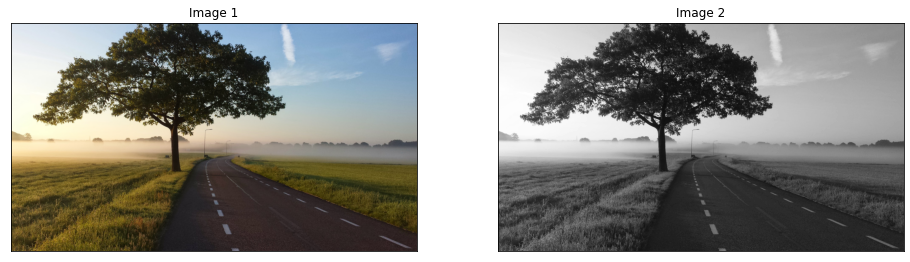

In [3]:
image_color = plt.imread('tree.jpg')
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
showTwoImages(image_color, image_gray)

## • Scaling

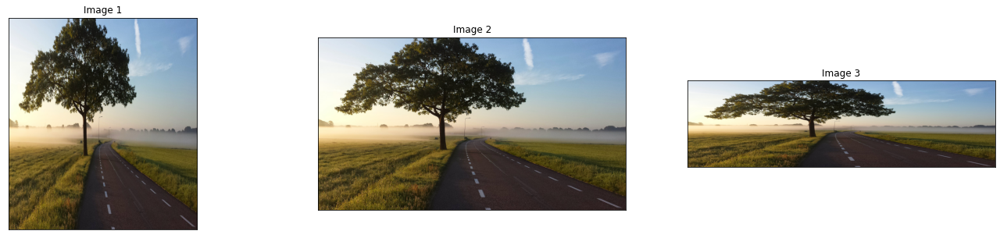

In [4]:
imgs = []
for fx, fy in zip([0.5, 0.5, 1], [1, 0.5, 0.5]):
    imgs.append(cv2.resize(image_color, None, fx = fx, fy = fy, interpolation = cv2.INTER_CUBIC))
showListImages(imgs, rows = 1, cols = len(imgs))

## • Rotation (30, 45, 60, 90, 120, 160, 180)

In [5]:
rows, cols = image_color.shape[:2]
imgs = [image_color,]
labels = ['Original',]
for angle in [30, 45, 60, 90, 120, 160, 180]:
    rotationMatrix = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    image_rotation = cv2.warpAffine(image_color, rotationMatrix, (cols, rows))
    imgs.append(image_rotation)
    labels.append(f'Rotate with angle = {angle}')

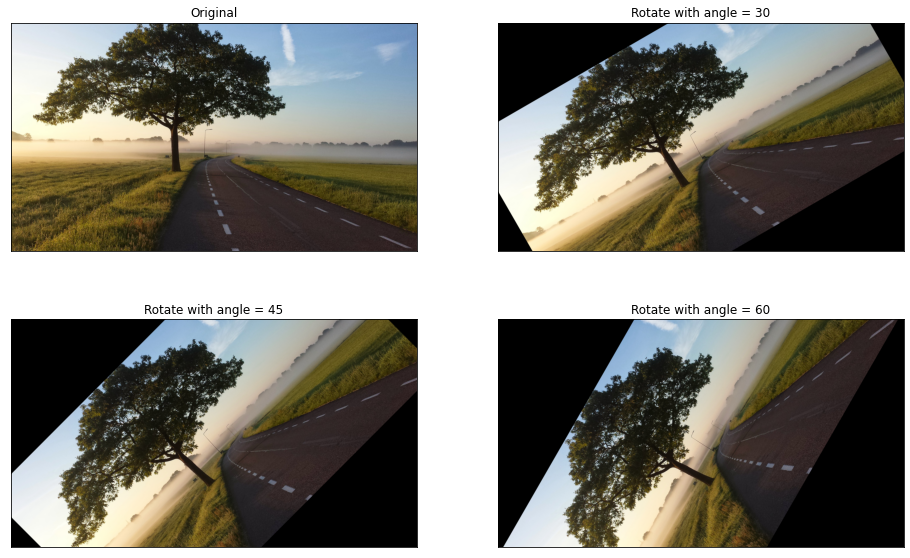

In [6]:
showListImages(imgs[:4], labels[:4], rows = 2, cols = 2)

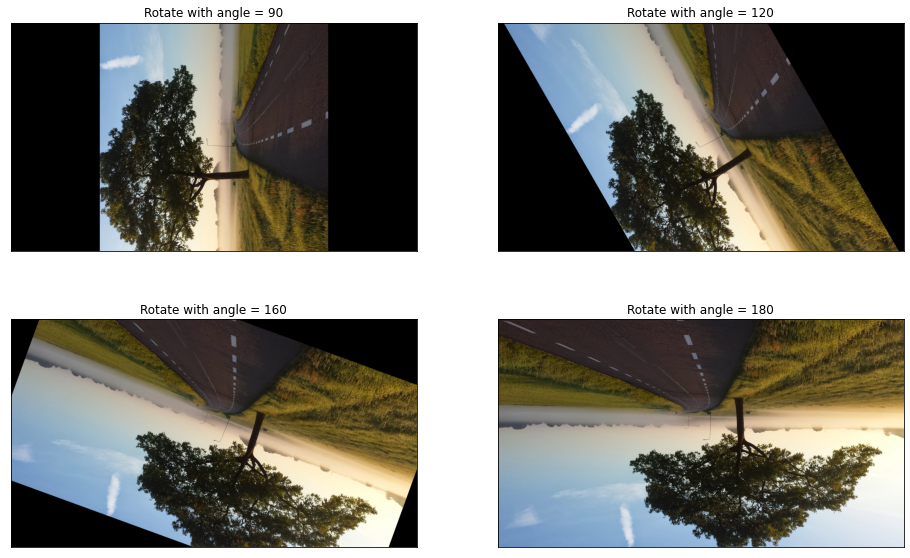

In [7]:
showListImages(imgs[4:], labels[4:], rows = 2, cols = 2)

## • Translation

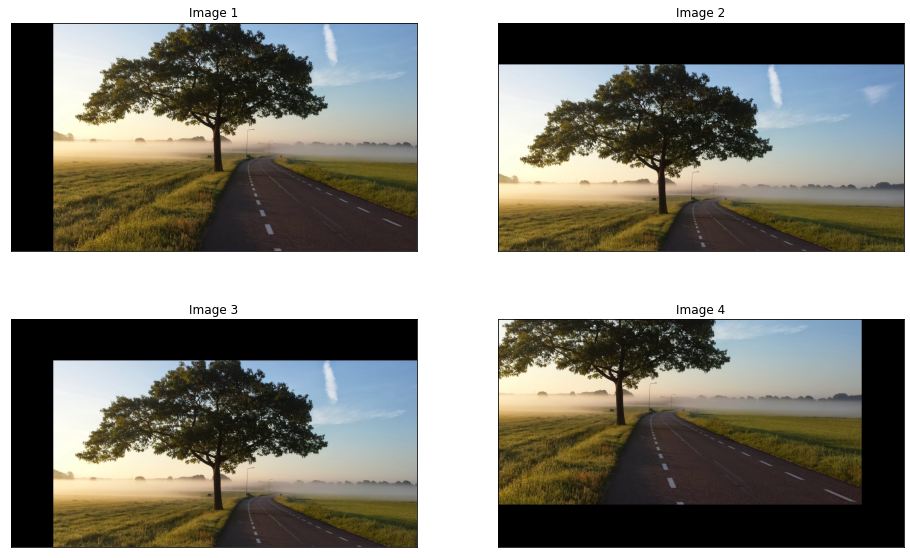

In [8]:
mtrxs = [
    np.array([
        [1, 0, 200],
        [0, 1, 0]], dtype = np.float32),
    np.array([
        [1, 0, 0],
        [0, 1, 200]], dtype = np.float32),
    np.array([
        [1, 0, 200],
        [0, 1, 200]], dtype = np.float32),
    np.array([
        [1, 0, -200],
        [0, 1, -200]], dtype = np.float32)
]
rows,cols  = image_color.shape[:2]
imgs = []
for mat in mtrxs:
    result = cv2.warpAffine(image_color, mat, (cols,rows))
    imgs.append(result)
showListImages(imgs, rows = 2, cols = 2)

## • Shearing

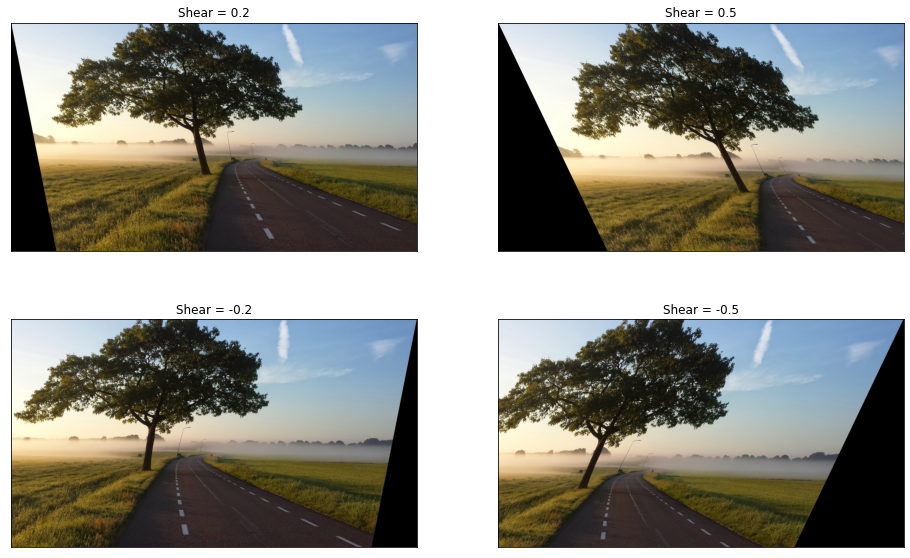

In [9]:
from skimage import transform as tf
rows, cols = image_color.shape[:2]
imgs = []
labels = []
for sh in [0.2, 0.5, -0.2, -0.5]:
    affine_tf = tf.AffineTransform(shear = sh)
    result = tf.warp(image_color, inverse_map = affine_tf)
    imgs.append(result)
    labels.append(f'Shear = {sh}')
showListImages(imgs, labels, rows = 2, cols = 2)

## 2/ Kiếm 1 ảnh từ internet thực hiện các thao tác biến đổi sau bằng cách nhân thông qua ma trận biến đổi  
    • Scaling
    • Rotation (30, 45, 60, 90, 120, 160, 180)
    • Translation
    • Shearing

In [10]:
def fromImageToMatrix(img):
    H,V,C = img.shape
    mtr = np.zeros((V,H,C), dtype='int')
    for i in range(img.shape[0]):
        mtr[:,i] = img[i]
    return mtr

def fromMatrixToImage(mtr):
    V,H,C = mtr.shape
    img = np.zeros((H,V,C), dtype='int')
    for i in range(mtr.shape[0]):
        img[:,i] = mtr[i]
    return img

In [11]:
def warpAffine(img, transformMatrix, res_shape = None, bounded = False):
    mtrx = fromImageToMatrix(img)
    if res_shape is None:
        res_shape = mtrx.shape
    rs, cs = mtrx.shape[:2]
    dim = len(mtrx.shape)
    X, Y = np.meshgrid(np.arange(rs, dtype = int), np.arange(cs, dtype = int))
    X, Y = X.ravel(), Y.ravel()

    coords = np.vstack((X, Y, np.ones_like(X.flatten())))
    new_coords = transformMatrix.dot(coords)

    # Convert back to integer
    new_coords = np.vectorize(int)(new_coords)

    new_X, new_Y = new_coords[0, :], new_coords[1, :]
    if bounded is True:
        new_X, new_Y = new_coords[0, :], new_coords[1, :]
        if new_X.min() < 0:
            new_X += np.abs(new_X.min())
        if new_Y.min() < 0:
            new_Y += np.abs(new_Y.min())
    
        newRows, newCols = new_X.max() + 1, new_Y.max() + 1
        if dim == 3:
            result = np.zeros((newRows, newCols, 3), dtype = mtrx.dtype) 
        else:
            result = np.zeros((newRows, newCols), dtype = mtrx.dtype)

        result[new_X, new_Y] = mtrx[X, Y]
        return fromMatrixToImage(result)
    else:
        result = np.zeros(res_shape, dtype = mtrx.dtype)
        cond = (new_X >= 0) & (new_Y >= 0) & (new_X <= res_shape[0] - 1) & (new_Y <= res_shape[1] - 1)

        new_X, new_Y = new_X[cond], new_Y[cond]
        X, Y = X[cond], Y[cond]
        result[new_X, new_Y] = mtrx[X, Y]
        return fromMatrixToImage(result)

In [12]:
def getRotationMatrix(angle, center):
    angle = angle * np.pi/180
    center_x, center_y = center
    rotationMatrix = np.array([
        [np.cos(angle), np.sin(angle), center_x - center_x * np.cos(angle) - center_y * np.sin(angle)],
        [-np.sin(angle), np.cos(angle), center_y + center_x * np.sin(angle) - center_y * np.cos(angle)],
        [0, 0, 1]
    ])
    return rotationMatrix

In [13]:
def getTranslationMatrix(dx, dy):
    translationMatrix = np.array([
        [1, 0, dx],
        [0, 1, dy],
        [0, 0, 1]
    ])
    return translationMatrix

In [14]:
def getShearingMatrix(sh):
    shearMatrix = np.array([
        [1, sh, 0],
        [0, 1, 0],
        [0, 0, 1]
    ])
    return shearMatrix

In [15]:
def getScaleMatrix(fx, fy):
    scaleMatrix = np.array([
        [fx, 0, 0],
        [0, fy, 0],
        [0, 0, 1]
    ])
    return scaleMatrix

## • Scaling

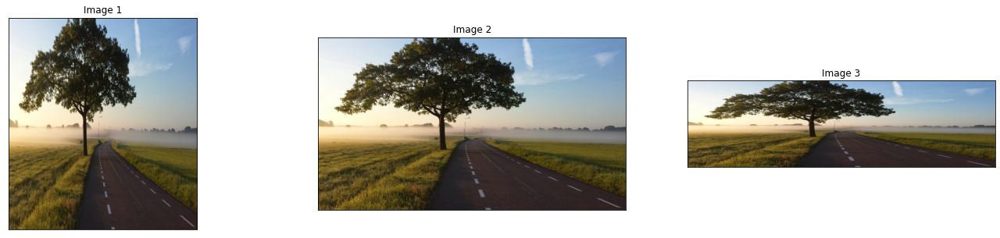

In [16]:
imgs = []
for fx, fy in zip([0.5, 0.5, 1], [1, 0.5, 0.5]):
    cs, rs = image_color.shape[:2]
    newW, newH = int(rs * fx), int(cs * fy)
    mat = getScaleMatrix(fx, fy)
    res = warpAffine(image_color, mat, res_shape = (newW, newH, 3))
    imgs.append(res)
showListImages(imgs, rows = 1, cols = len(imgs))

## • Rotation (30, 45, 60, 90, 120, 160, 180)

In [17]:
rows, cols = image_color.shape[:2]
imgs = [image_color,]
labels = ['Original',]
for angle in [30, 45, 60, 90, 120, 160, 180]:
    rotationMatrix = getRotationMatrix(angle, (cols//2, rows//2))
    image_rotation = warpAffine(image_color, rotationMatrix)
    imgs.append(image_rotation)
    labels.append(f'Rotate with angle = {angle}')

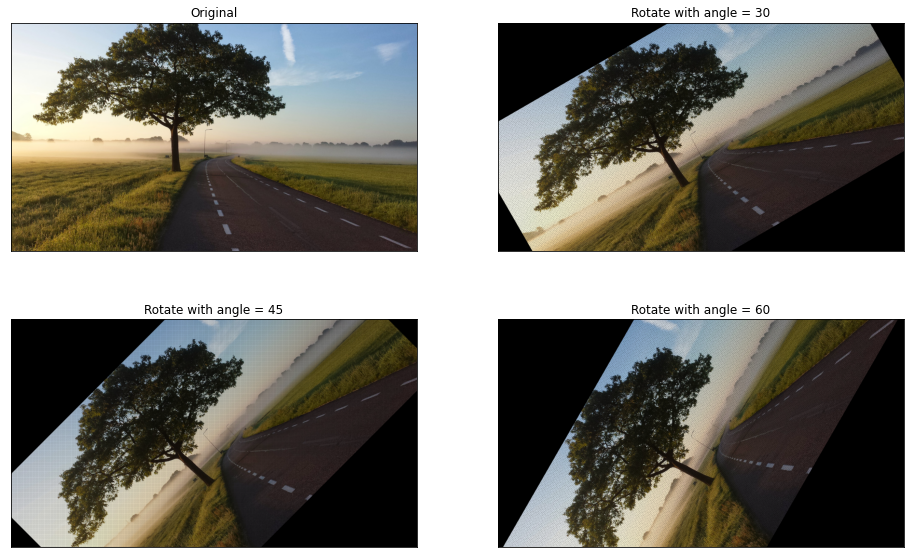

In [18]:
showListImages(imgs[:4], labels[:4], rows = 2, cols = 2)

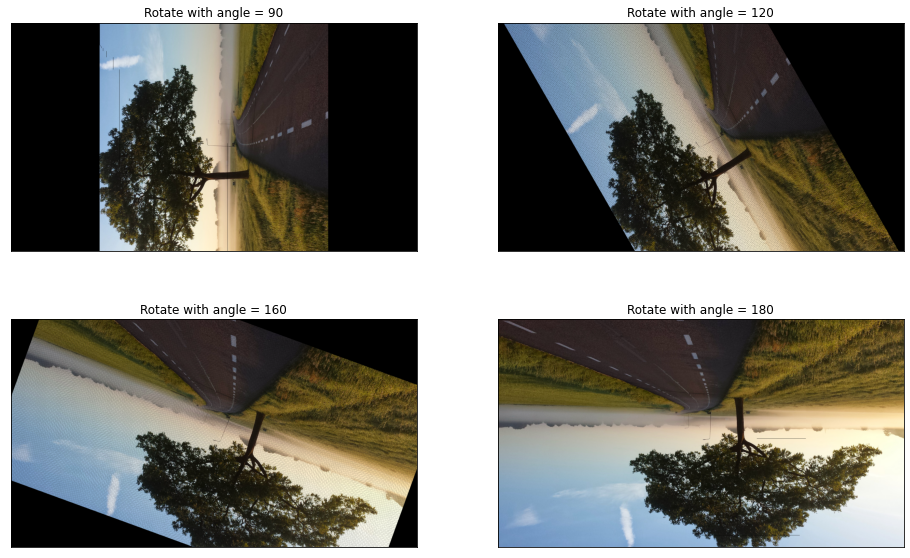

In [19]:
showListImages(imgs[4:], labels[4:], rows = 2, cols = 2)

In [20]:
rows, cols = image_color.shape[:2]
imgs = [image_color,]
labels = ['Original',]
for angle in [30, 45, 60, 90, 120, 160, 180]:
    rotationMatrix = getRotationMatrix(angle, (cols//2, rows//2))
    image_rotation = warpAffine(image_color, rotationMatrix, bounded = True)
    imgs.append(image_rotation)
    labels.append(f'Bounded Rotation with angle = {angle}')

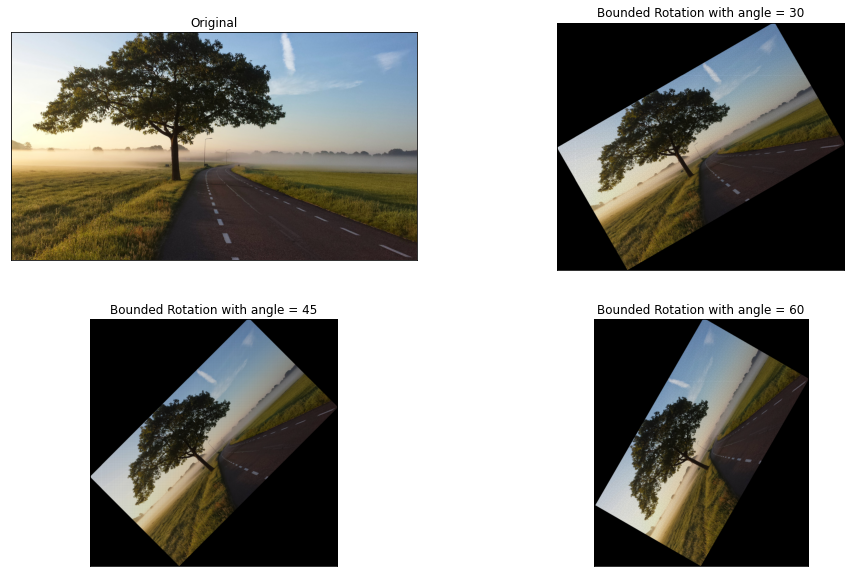

In [21]:
showListImages(imgs[:4], labels[:4], rows = 2, cols = 2)

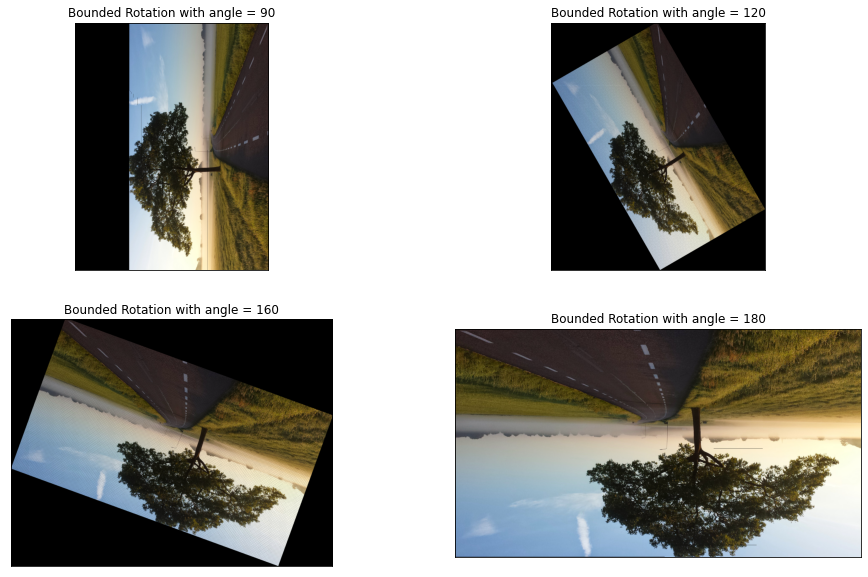

In [22]:
showListImages(imgs[4:], labels[4:], rows = 2, cols = 2)

## • Translation

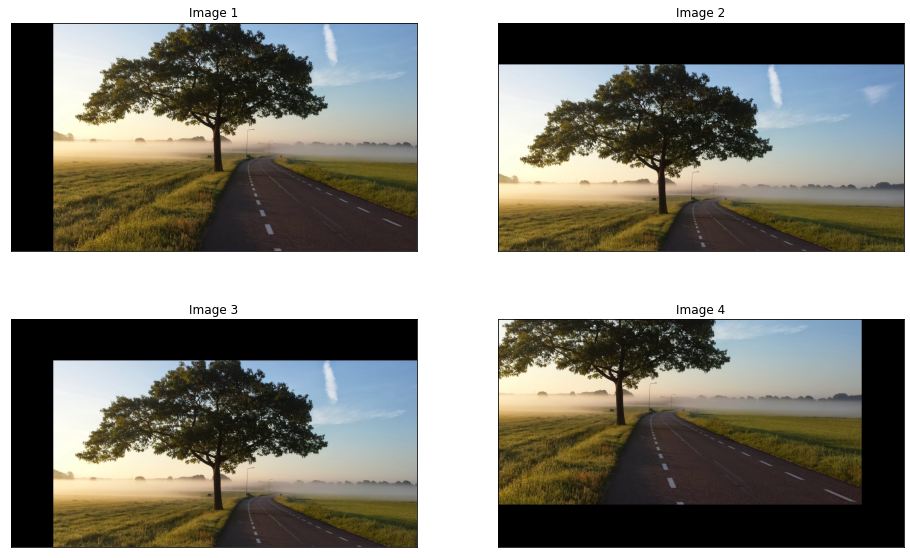

In [23]:
imgs = []
for dx, dy in zip([200, 0, 200, -200], [0, 200, 200, -200]):
    translationMatrix = getTranslationMatrix(dx, dy)
    result = warpAffine(image_color, translationMatrix)
    imgs.append(result)
showListImages(imgs, rows = 2, cols = 2)

## • Shearing

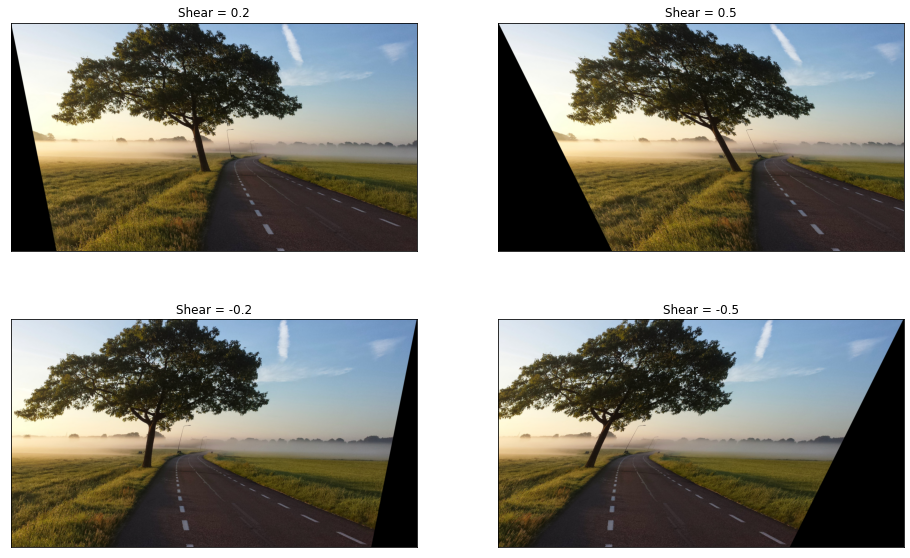

In [24]:
imgs = []
labels = []
for sh in [0.2, 0.5, -0.2, -0.5]:
    shearingMatrix = getShearingMatrix(sh)
    result = warpAffine(image_color, shearingMatrix)
    imgs.append(result)
    labels.append(f'Shear = {sh}')
showListImages(imgs, labels, rows = 2, cols = 2)

## 3/ Cũng thực hiện nhân ma trận. Tạo các ma trận tổng hợp sau: 
    • Scaling -> Rotation
    • Rotation -> Shearing 
    • Scaling -> Rotation -> Shearing

## • Scaling -> Rotation

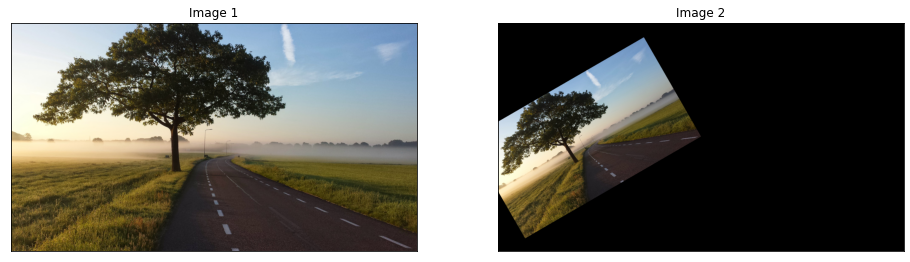

In [25]:
rows, cols = image_color.shape[:2]
scaleMatrix = getScaleMatrix(0.5, 0.5)
rotationMatrix = getRotationMatrix(30, (cols//2, rows//2))
combined = rotationMatrix.dot(scaleMatrix)
result = warpAffine(image_color, combined)

showTwoImages(image_color, result)

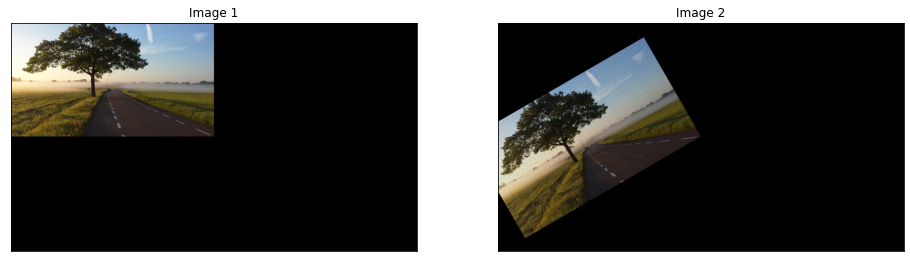

In [26]:
scale_first = warpAffine(image_color, scaleMatrix)
rotation_second = warpAffine(scale_first, rotationMatrix)

showTwoImages(scale_first, rotation_second)

## • Rotation -> Shearing

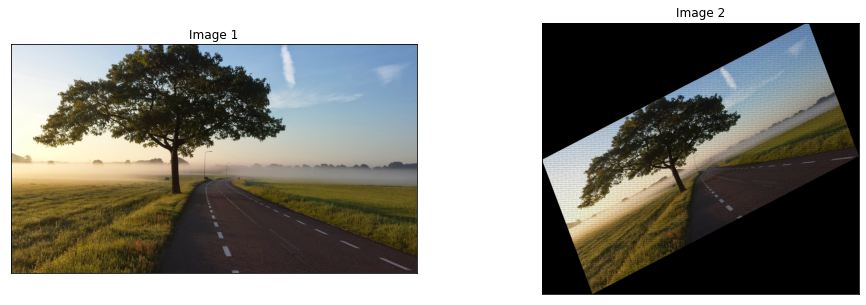

In [27]:
rows, cols = image_color.shape[:2]
rotationMatrix = getRotationMatrix(30, (cols//2, rows//2))
shearingMatrix = getShearingMatrix(-0.2)
combined = shearingMatrix.dot(rotationMatrix)

result = warpAffine(image_color, combined, bounded = True)

showTwoImages(image_color, result)

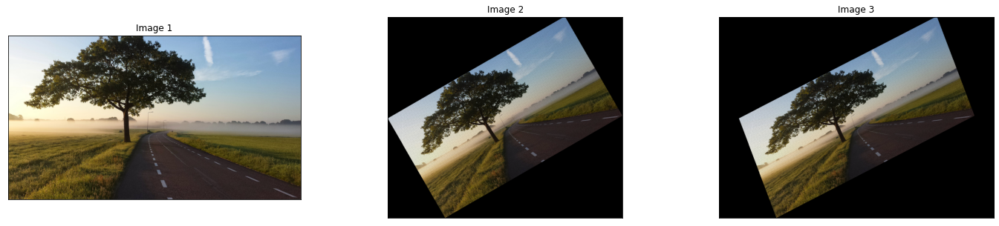

In [28]:
rotation_first = warpAffine(image_color, rotationMatrix, bounded = True)
shear_second = warpAffine(rotation_first, shearingMatrix, bounded = True)

showThreeImages(image_color, rotation_first, shear_second)

## • Scaling -> Rotation -> Shearing

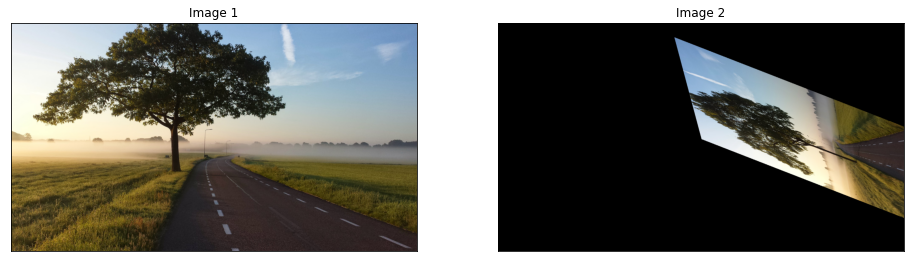

In [29]:
rows, cols = image_color.shape[:2]
scaleMatrix = getScaleMatrix(0.5, 0.5)
rotationMatrix = getRotationMatrix(30, (cols//2, rows//2))
shearingMatrix = getShearingMatrix(2)
combined = shearingMatrix.dot(rotationMatrix).dot(scaleMatrix)

result = warpAffine(image_color, combined)

showTwoImages(image_color, result)

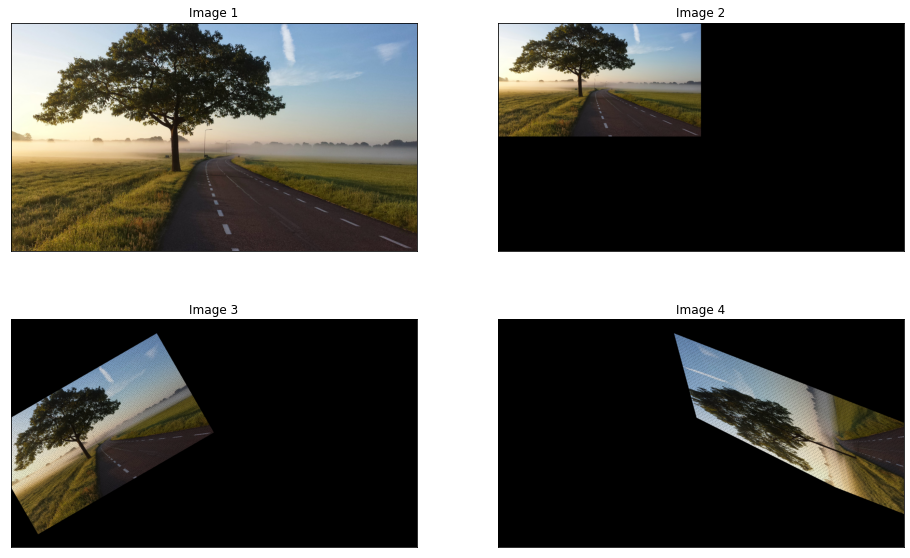

In [30]:
scale_first = warpAffine(image_color, scaleMatrix)
rotation_second = warpAffine(scale_first, rotationMatrix)
shear_third = warpAffine(rotation_second, shearingMatrix)

showListImages([image_color, scale_first, rotation_second, shear_third], rows = 2, cols = 2)

## 4/ Chụp một tấm ảnh bất kỳ từ điện thoại của bạn có chứa vật thể dạng hình chữ nhật hay hình vuông (ví dụ bức tranh, điện thoại, màn hình máy tính v.v…) (Lưu ý chụp nghiêng, xéo và không được chụp thẳng)
    • Xác định 4 điểm góc của đối tượng bằng tay  và vẽ chúng lên hình 
    • Dùng biến đổi Affine hoặc Perspective để canh chỉnh chúng thẳng lại

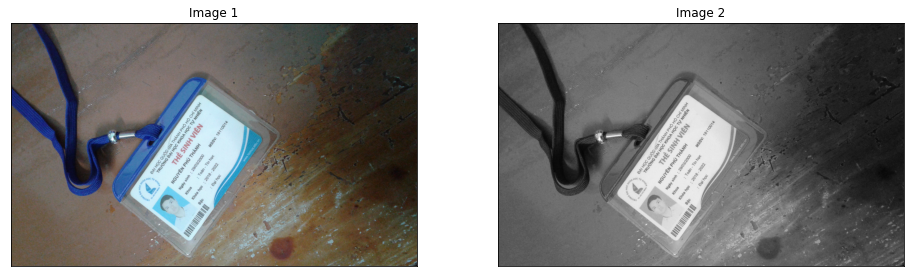

In [31]:
image_color = plt.imread('student_ID.jpg')
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
showTwoImages(image_color, image_gray)

In [32]:
points = np.array([(758, 1065), (1192, 461), (1589, 740), (1125, 1380)])
X, Y = points[:, 0], points[:, 1]

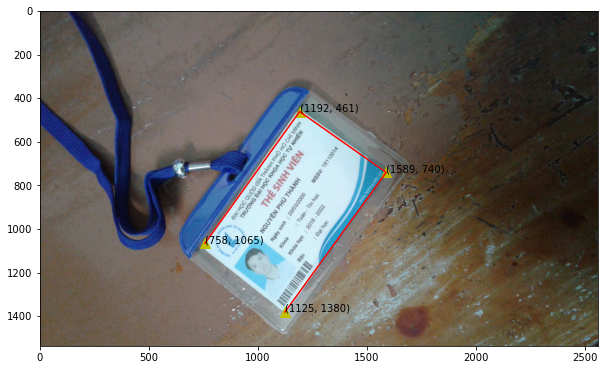

In [33]:
fig, ax = plt.subplots(figsize = (10, 8))
ax.imshow(image_color)
ax.scatter(X, Y, marker = '^', c = 'y', s = 100)
ax.plot(X, Y, color = 'red')

for x, y in zip(X, Y):
    ax.annotate(f'{x, y}', (x, y))
plt.show()

In [34]:
def getPerspectiveMatrix(src, dst):
    A = []
    for fr, to in zip(src, dst):
        x,y = fr
        X, Y = to
        A += [[x, y, 1, 0, 0, 0, -X * x, -X * y]]
        A += [[0, 0, 0, x, y, 1, -Y * x, -Y * y]]
    A = np.array(A)
    b = dst.ravel()
    b = b.reshape(b.shape[0], 1)
    sol = list(np.linalg.solve(A, b).ravel())
    sol.append(1)
    return np.array(sol).reshape((3,3))

In [35]:
def warpPerspective(img, M, output_size):
    mtr = fromImageToMatrix(img)
    R, C = output_size
    
    if len(mtr.shape) == 3:
        output = np.zeros((R, C, mtr.shape[2]), dtype = mtr.dtype)
    else:
        output = np.zeros((R, C), dtype = mtr.dtype)
    
    rs, cs = mtr.shape[:2]
    X, Y = np.meshgrid(np.arange(rs, dtype = int), np.arange(cs, dtype = int))
    coords = np.vstack((X.flatten(), Y.flatten(), np.ones_like(X.flatten())))
    
    res = M.dot(coords)
    newX, newY, Z = res[0, :], res[1, :], res[2, :]
    
    newX, newY = np.round(newX/Z + 0.5, decimals = 0).astype(int), np.round(newY/Z + 0.5, decimals = 0).astype(int)
    
    cond = (newX >= 0) & (newX < R) & (newY >= 0) & (newY < C)
    
    newX, newY = newX[cond], newY[cond]
    X, Y = X.flatten()[cond], Y.flatten()[cond]
    output[newX, newY] = mtr[X, Y]
    
    return fromMatrixToImage(output)

In [36]:
desired = np.array([
    [0, 0],
    [400, 0],
    [400, 200],
    [0, 200]
])

perspectiveMat = getPerspectiveMatrix(points, desired)

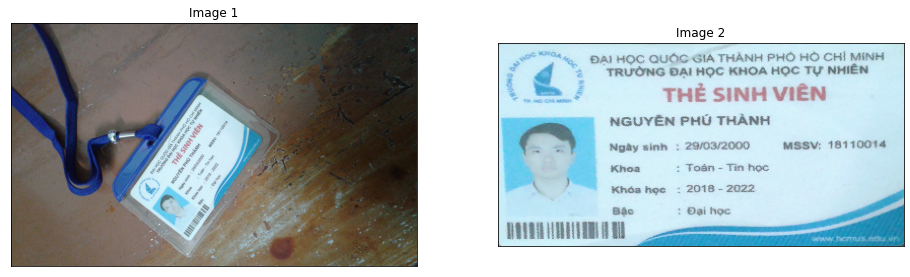

In [37]:
result = warpPerspective(image_color, perspectiveMat, (400, 200))
showTwoImages(image_color, result)

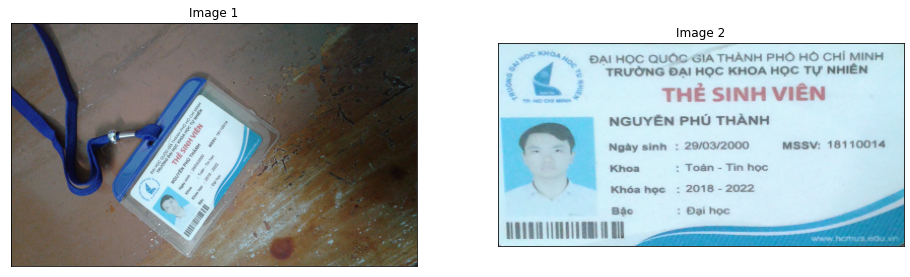

In [38]:
# So sánh với hàm thư viện
pts1 = np.float32(points)
pts2 = np.float32(desired)
MappingMatrix = cv2.getPerspectiveTransform(pts1,pts2)
image_Perspective = cv2.warpPerspective(image_color,MappingMatrix,(400,200))
showTwoImages(image_color, image_Perspective)